# Accessing Data

In [1]:
#This gets us into the right directory from home, in order to run the import python script from Mat

#sys = system (module), gives information and control over python interpreter/terminal itself
import sys
sys.path.append("/home/565/pv3484/aus_substation_electricity-main")

#% is a magic command, special shortcut command that lets you control/interact with notebook environment (ie. gives control of terminal without writing full python code)
%cd aus_substation_electricity-main/

!pwd

/home/565/pv3484/aus_substation_electricity-main
/home/565/pv3484/aus_substation_electricity-main


In [2]:
#This section imports the substations that Mat put together

%run /home/565/pv3484/aus_substation_electricity-main/import_substation.py

processing nsw substations for ['ausgrid'] from None to None
ausgrid
following columns in demand are not in info index:
['MT_HU', 'SI_NO']
removing these columns from demand
number of substations in ausgrid substation info: 134
number of substations in ausgrid substation data: 132
following sites match selection criteria:
               energy_asset          Name  Area  Dwellings  Persons  Residential  Commercial  Industrial  Primary Production  Education  \
ID                                                                                                                                        
BLAKE         AG_BLAKEHURST    Blakehurst     7      10081    28521        0.850       0.005       0.021               0.000      0.022   
PUNCH          AG_PUNCHBOWL     Punchbowl     9      17514    50395        0.826       0.048       0.038               0.000      0.025   
MEADO         AG_MEADOWBANK    Meadowbank    15      22420    56948        0.825       0.023       0.015               0

# Demand per capita

## Trial 1

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import matplotlib  # for matplotlib.colormaps
from dateutil.easter import easter

def plot_holiday_per_capita(demand, info, holiday_name, holiday_fn, years, cmap_name='plasma',
                            pop_col='Persons', name_col='Name'):
    """
    Plot per-capita electricity demand for all substations on a chosen holiday across multiple years.

    Parameters
    ----------
    demand : pd.DataFrame
        Half-hourly demand data (index = datetime, columns = substations).
    info : pd.DataFrame
        Metadata for substations, must include population and full name columns.
    holiday_name : str
        Name of the holiday (for titles/labels).
    holiday_fn : function(year) -> pd.Timestamp
        Function that returns the holiday date for a given year.
        Example: lambda y: pd.Timestamp(f"{y}-12-25") for Christmas.
    years : list of int
        Years to include in the plot.
    cmap_name : str
        Matplotlib colormap name (default 'plasma').
    pop_col : str
        Column in info containing population values.
    name_col : str
        Column in info containing full substation names.
    """

    # Ensure datetime index
    demand.index = pd.to_datetime(demand.index)

    substations = demand.columns.tolist()
    cmap = matplotlib.colormaps.get_cmap(cmap_name)
    norm = mcolors.Normalize(vmin=min(years), vmax=max(years))

    for substation in substations:
        plt.figure(figsize=(10, 4))
        # Get population and full name from info
        pop = info.loc[substation, pop_col]
        full_name = info.loc[substation, name_col]

        for year in years:
            holiday_date = holiday_fn(year)
            day_data = demand[demand.index.date == holiday_date.date()]
            if day_data.empty:
                continue

            # Fractional hours
            x = day_data.index.hour + day_data.index.minute / 60.0
            # Normalize demand by population
            y = day_data[substation].values / pop

            color = cmap(norm(year))
            plt.plot(x, y, color=color, label=str(year))

        plt.title(f'Per Capita Demand on {holiday_name} – {full_name}')
        plt.xlabel('Time of Day (hour)')
        plt.ylabel('Electricity Demand per Person (kW/person)')
        plt.legend(title='Year', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize='small')
        plt.xlim(0, 24)
        xticks = np.arange(0, 25, 2)
        plt.xticks(xticks, [f'{t:02d}:00' for t in xticks], rotation=45)
        plt.tight_layout()
        #plt.show()

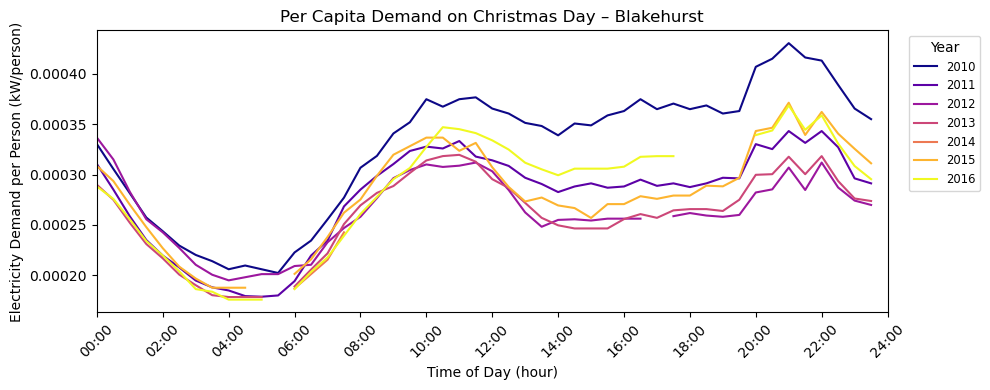

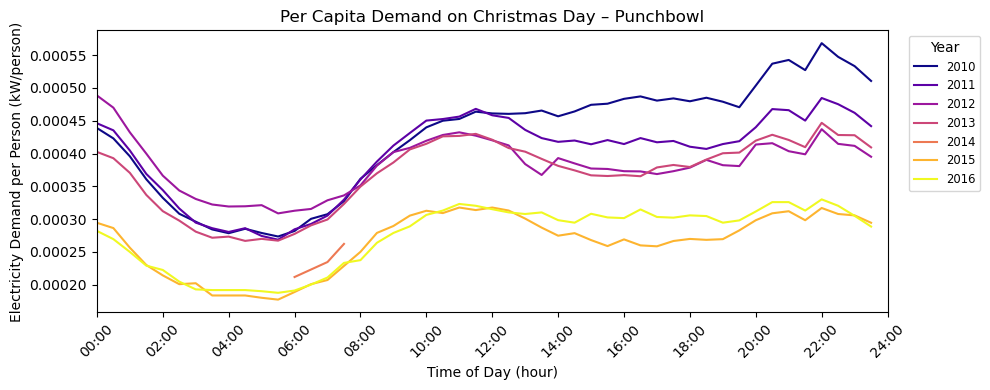

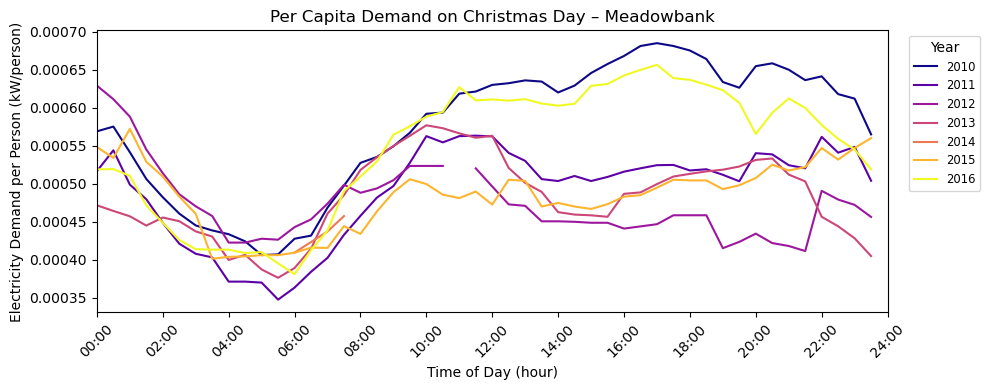

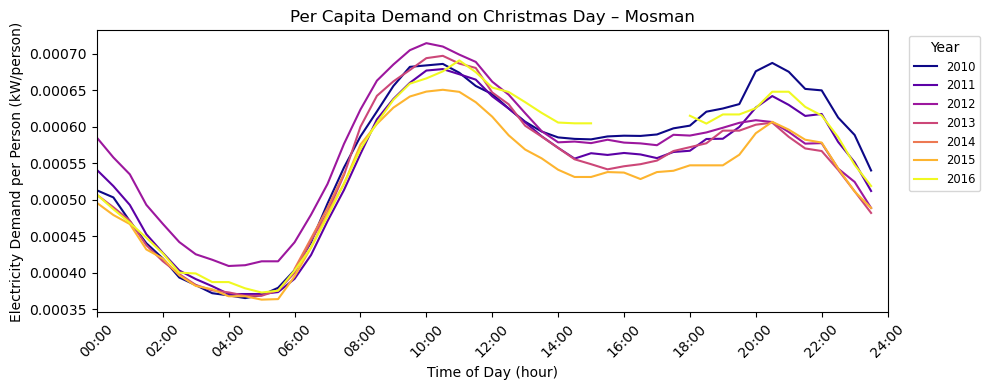

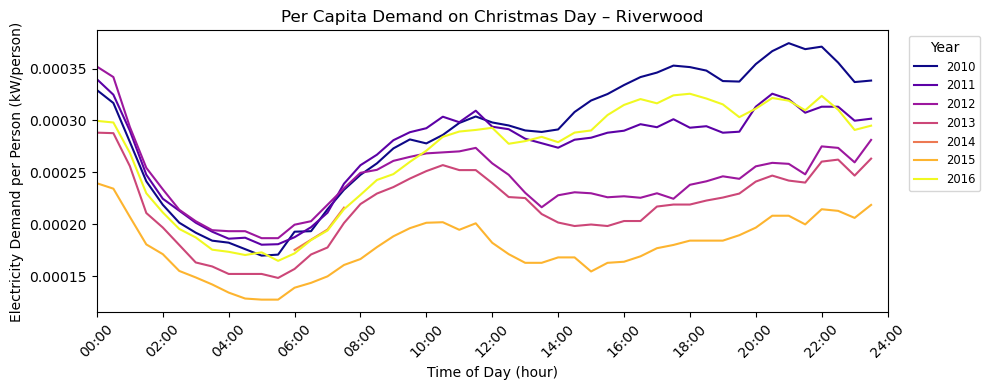

...

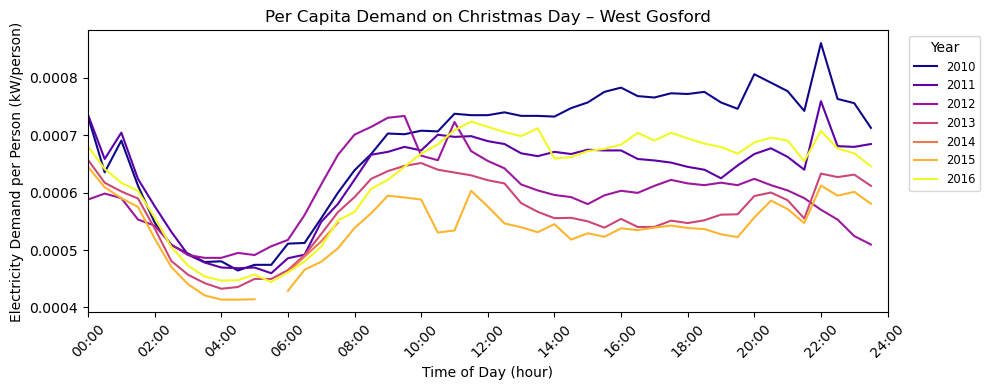

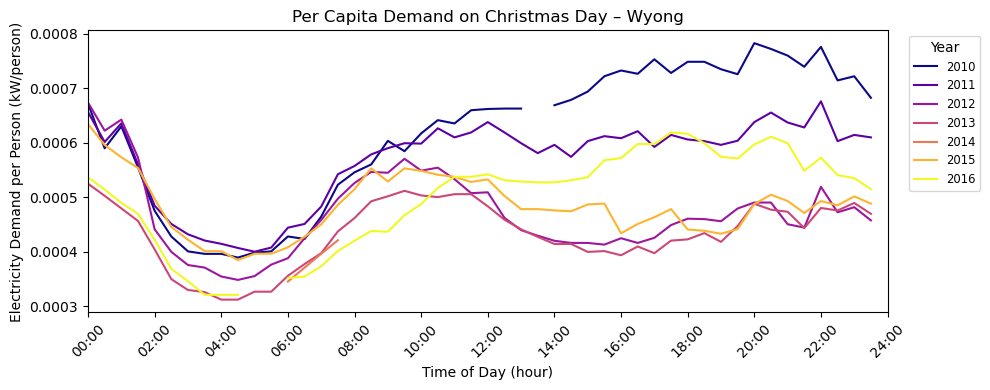

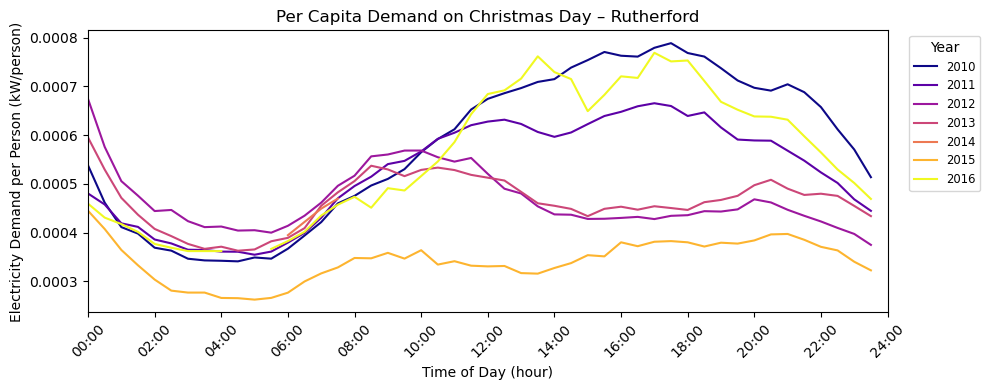

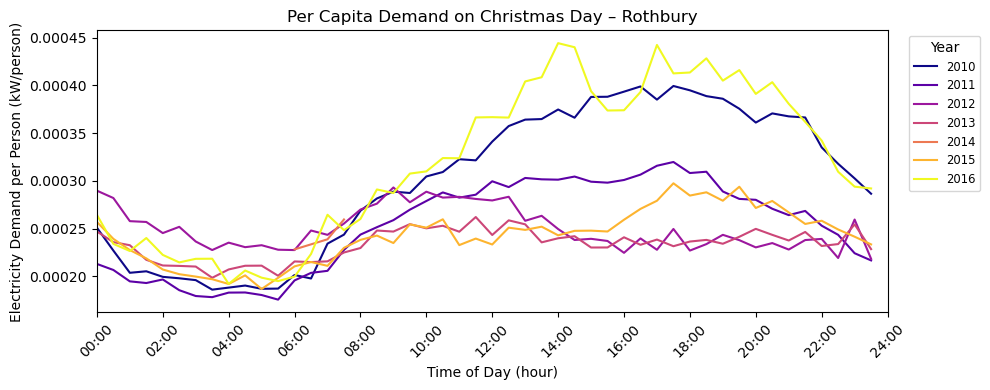

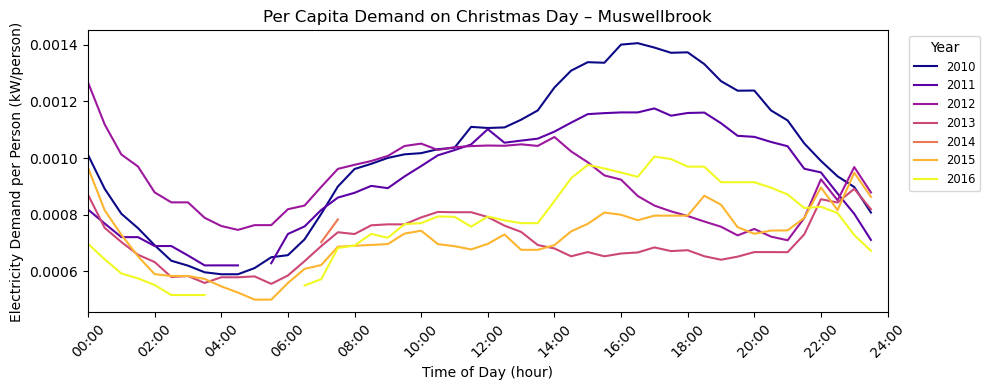

In [29]:
plot_holiday_per_capita(
    demand, info,
    holiday_name="Christmas Day",
    holiday_fn=lambda y: pd.Timestamp(f"{y}-12-25"),
    years=list(range(2010, 2017))
)

## Trial 2 (fixing y axis)

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import matplotlib  # for matplotlib.colormaps
from dateutil.easter import easter

def plot_holiday_per_capita(
    demand, info, holiday_name, holiday_fn, years,
    cmap_name='plasma', pop_col='Persons', name_col='Name',
    unit='W'
):
    """
    Plot per-capita electricity demand for all substations on a chosen holiday across multiple years.

    Parameters
    ----------
    demand : pd.DataFrame
        Half-hourly demand data (index = datetime, columns = substations).
    info : pd.DataFrame
        Metadata for substations, must include population and full name columns.
    holiday_name : str
        Name of the holiday (for titles/labels).
    holiday_fn : function(year) -> pd.Timestamp
        Function that returns the holiday date for a given year.
        Example: lambda y: pd.Timestamp(f"{y}-12-25") for Christmas.
    years : list of int
        Years to include in the plot.
    cmap_name : str
        Matplotlib colormap name (default 'plasma').
    pop_col : str
        Column in info containing population values.
    name_col : str
        Column in info containing full substation names.
    unit : str
        Normalisation unit: 'raw' (original per person), 'W' (Watts/person),
        or 'kWh' (kWh/person per half-hour).
    """

    # Ensure datetime index
    demand.index = pd.to_datetime(demand.index)

    substations = demand.columns.tolist()
    cmap = matplotlib.colormaps.get_cmap(cmap_name)
    norm = mcolors.Normalize(vmin=min(years), vmax=max(years))

    for substation in substations:
        plt.figure(figsize=(10, 4))
        pop = info.loc[substation, pop_col]
        full_name = info.loc[substation, name_col]

        for year in years:
            holiday_date = holiday_fn(year)
            day_data = demand[demand.index.date == holiday_date.date()]
            if day_data.empty:
                continue

            # Fractional hours
            x = day_data.index.hour + day_data.index.minute / 60.0
            # Normalise demand by population with chosen unit
            if unit == 'raw':
                y = day_data[substation].values / pop
                ylabel = "Electricity Demand per Person (raw units)"
            elif unit == 'W':
                # assume demand is in MW -> convert to W/person
                y = (day_data[substation].values * 1_000_000) / pop
                ylabel = "Electricity Demand per Person (W/person)"
            elif unit == 'kWh':
                # assume demand is in MW -> convert to kWh per half-hour per person
                y = (day_data[substation].values * 0.5 * 1000) / pop
                ylabel = "Electricity Consumption per Person (kWh per 30 min)"
            else:
                raise ValueError("unit must be 'raw', 'W', or 'kWh'")

            color = cmap(norm(year))
            plt.plot(x, y, color=color, label=str(year))

        plt.title(f'{holiday_name} Demand per Capita – {full_name}')
        plt.xlabel('Time of Day (hour)')
        plt.ylabel(ylabel)
        plt.legend(title='Year', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize='small')
        plt.xlim(0, 24)
        xticks = np.arange(0, 25, 2)
        plt.xticks(xticks, [f'{t:02d}:00' for t in xticks], rotation=45)
        plt.tight_layout()
        #plt.show()

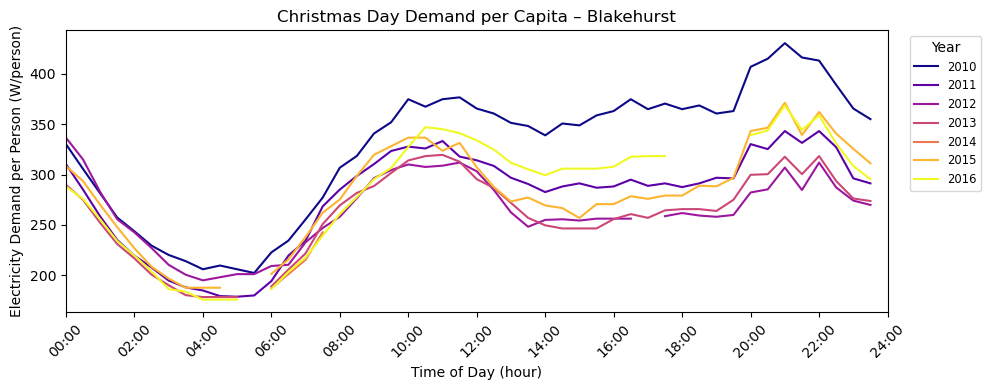

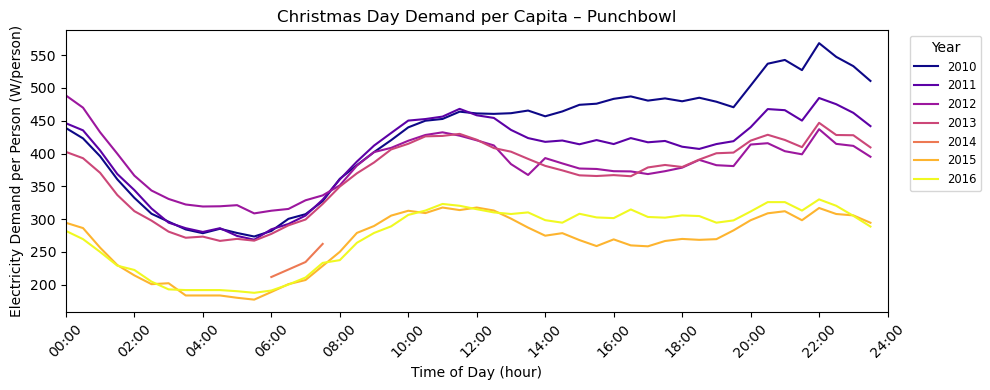

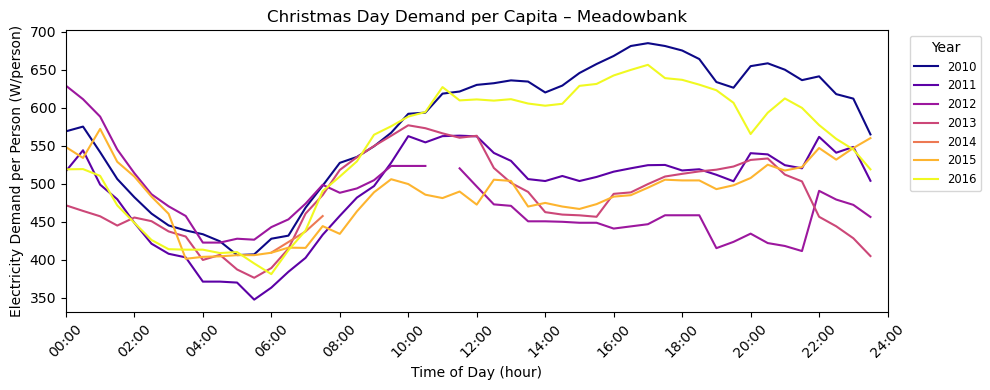

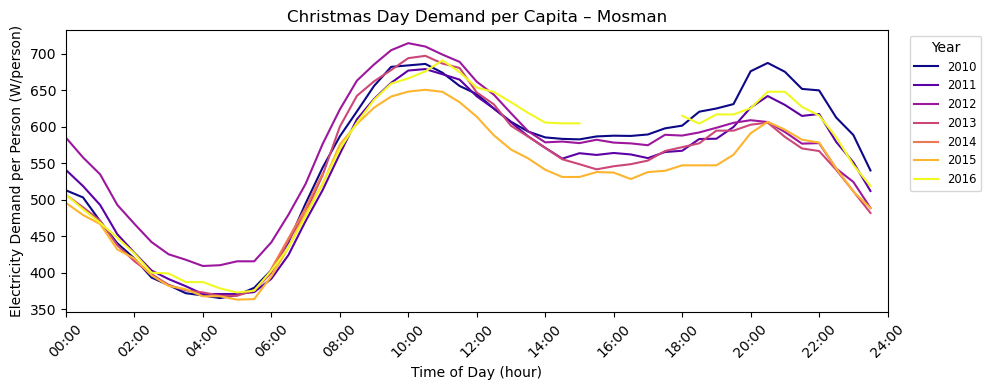

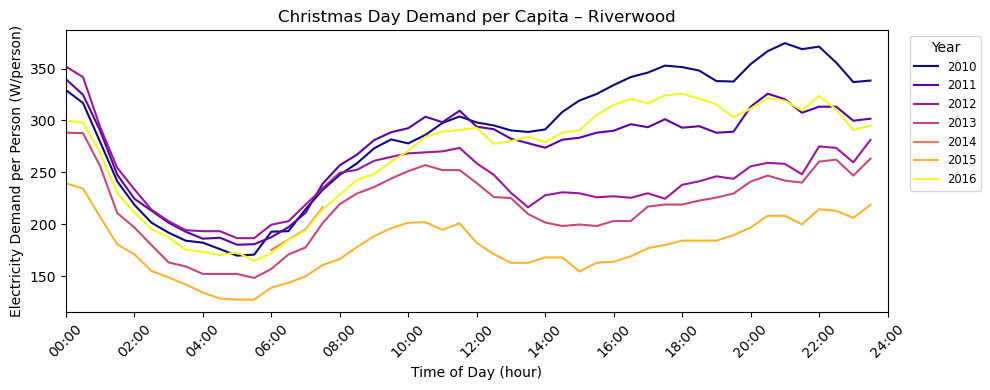

...

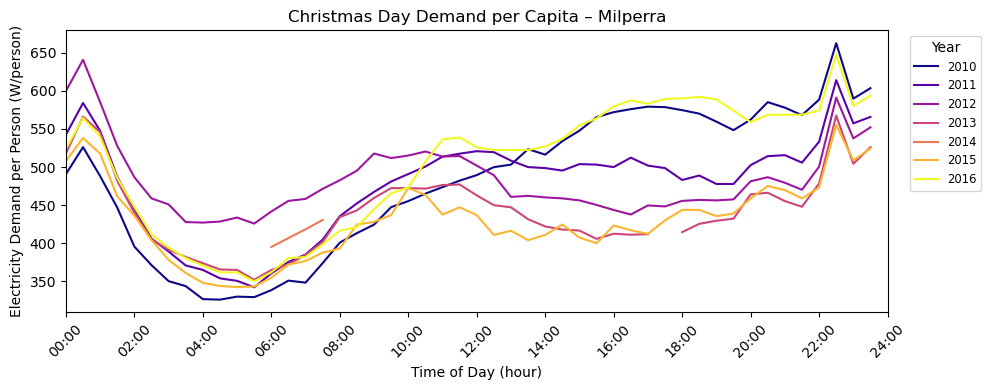

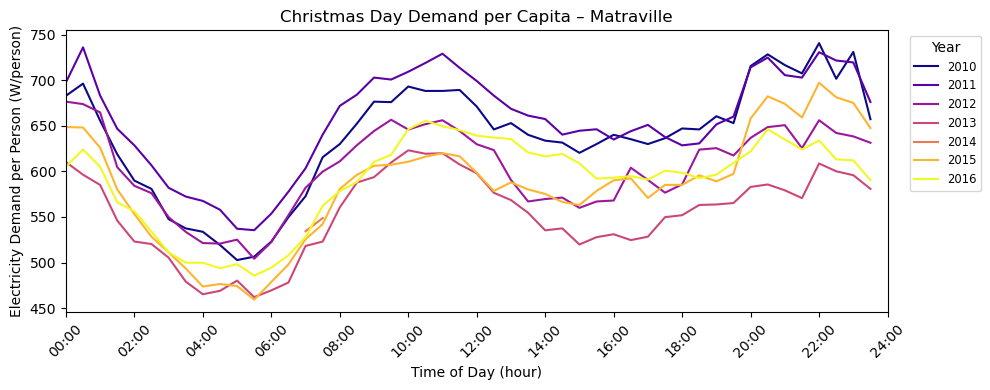

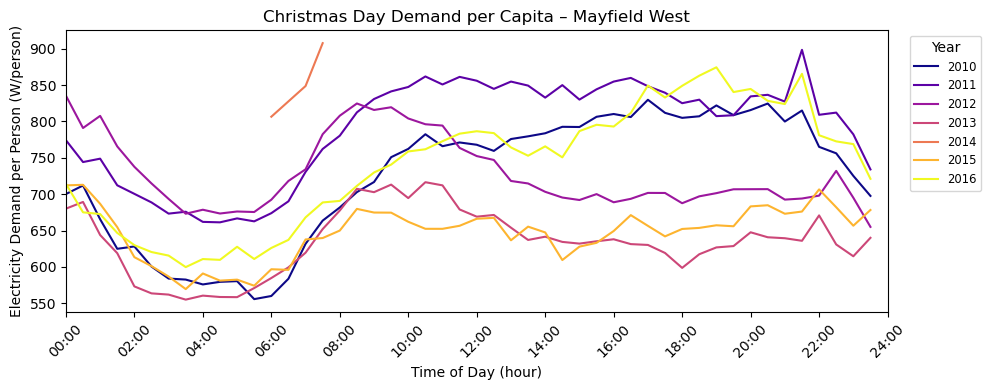

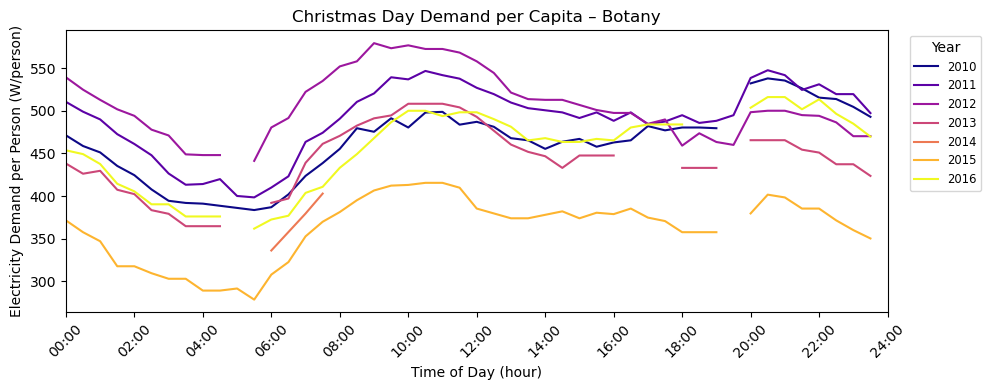

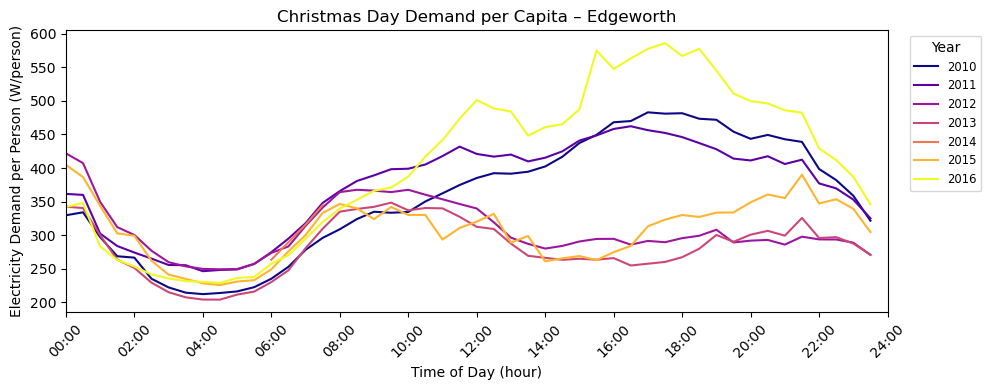

In [ ]:
plot_holiday_per_capita(
    demand, info,
    holiday_name="Christmas Day",
    holiday_fn=lambda y: pd.Timestamp(f"{y}-12-25"),
    years=list(range(2010, 2017)),
    unit='W'
)